# Анализ рынка заведений общественного питания города Москвы

Заказчиками была поставлена задача исследовать рынок общественного питания в Москве рассмотрев следующие категории: кафе, ресторан, пиццерия, паб или бар, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Введение

Для исследования нам предоставлены данные заведений общественного питания города Москвы в датафрейме `moscow_places.csv`

**`Цели исследования:`**
1. Изучение рынка общественного питания в городе Москва;
2. Определение наибольшее подходящей категории заведения общепита для открытия в городе Москва;
3. Определить наиболее подходящий график работы заведений;
4. Определить средний рейтинг категорий заведений на территории Москвы;
5. Определить расположение заведений на территории города Москвы;
6. Посчитать медиану среднего чека. 

**`Ход исследования`**

Работа будет разделена на несколько этапов, в каждом из которых есть ряд задач, которые необходимо выполнить:

**Этап 1** - загрузка, анализ и предобработка первичных данных
1. Загрузка и осуществить первичный анализ датафрейма;
2. Осуществить предобработку данных;
3. Добавить новые столбцы (при необходимости).

**Этап 2** - анализ основных данных
1. Найти категории заведений представлены в данных;
2. Исследуйте количество посадочных мест;
3. Рассмотреть и изобразить соотношение сетевых и несетевых заведений;
4. Выяснить какие заведения чаще являются сетевыми;
5. Найти топ-15 популярных сетей в Москве;
6. Выяснить какие административные районы Москвы присутствуют в датасете;
7. Посчитать медиану среднего чека для каждого района;
8. Найти улицы, на которых находится только один объект общепита;
9. Сделать общий вывод по указанным выше метрикам.

**Этап 3** - детализация исследования на примере открытия кофейни
1. Выяснить количетсво кофеен в датасете, распределение их по районам и особенности расположения;
2. Уточнить имеются ли круглосуточных кофеен;
3. Посмотреть рейтинги кофеен в зависимости от их расположения;
4. Рассчитать среднюю стоимость чашки капучино на которую стоит ориентироваться. 

**Этап 4** - подготовка презентации для заказчиков с общими выводами и визуализациями.



## **`Этап 1`** - загрузка, анализ и предобработка первичных данных

**Импортируем все необходимые библиотеки для дальнейшего анализа**

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
from scipy import stats as st
from plotly.offline import init_notebook_mode, iplot
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import plotly
import plotly.express as px
import plotly.graph_objs as go
import math as mth
import json
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

pd.set_option('display.max_colwidth', False)

**Загрузим файл с данными и проанализируем его**

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

**Посмотрим основную информацию о представленных данных**

In [3]:
#Создадим функцию inspect для просмотра основной информации по датафрейму
def inspect(x):
    display(df.head()) 
    df.info()
    print('Количество пропусков -', df.isna().sum())
    print ('Количество дубликатов -', df.duplicated().sum())
    numeric_columns=df.describe().columns
    display(df.describe())
    display()
    for column_name in df.columns:
            display(df[column_name].value_counts())
            print(50*'*')
    return df
x = inspect(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
Количество пропусков - name                 0   
category    

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Кафе                189
Шоколадница         120
Домино'с Пицца      76 
Додо Пицца          74 
One Price Coffee    71 
                    .. 
I-chef бистро       1  
Два гуся            1  
Рублёв              1  
Sport club G5+      1  
Китчен              1  
Name: name, Length: 5614, dtype: int64

**************************************************


кафе               2378
ресторан           2043
кофейня            1413
бар,паб            765 
пиццерия           633 
быстрое питание    603 
столовая           315 
булочная           256 
Name: category, dtype: int64

**************************************************


Москва, проспект Вернадского, 86В       28
Москва, Усачёва улица, 26               26
Москва, Ярцевская улица, 19             20
Москва, площадь Киевского Вокзала, 2    20
Москва, Каширское шоссе, 61Г            16
                                        ..
Москва, улица Шаболовка, 58             1 
Москва, улица Крымский Вал, 9с34        1 
Москва, Самарская улица, 1              1 
Москва, Шоссейная улица, 30, стр. 2     1 
Москва, Тагильская улица, 6, стр. 1     1 
Name: address, Length: 5753, dtype: int64

**************************************************


Центральный административный округ         2242
Северный административный округ            900 
Южный административный округ               892 
Северо-Восточный административный округ    891 
Западный административный округ            851 
Восточный административный округ           798 
Юго-Восточный административный округ       714 
Юго-Западный административный округ        709 
Северо-Западный административный округ     409 
Name: district, dtype: int64

**************************************************


ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
пн-чт 13:00–00:00; пт,сб 13:00–03:00; вс 13:00–00:00    1  
вт-вс 14:00–22:00                                       1  
вт-вс 10:00–21:00                                       1  
пн-пт 07:00–22:30; сб,вс 08:00–22:00                    1  
ежедневно, 08:00–03:00                                  1  
Name: hours, Length: 1307, dtype: int64

**************************************************


55.805361    3
55.762784    3
55.783477    3
55.746918    3
55.706883    3
            ..
55.761960    1
55.792516    1
55.770445    1
55.761305    1
55.726613    1
Name: lat, Length: 8209, dtype: int64

**************************************************


37.732745    3
37.653027    3
37.574534    3
37.552480    3
37.513952    3
            ..
37.593804    1
37.671945    1
37.613680    1
37.659817    1
37.667622    1
Name: lng, Length: 8258, dtype: int64

**************************************************


4.3    1513
4.4    1351
4.2    1041
4.1    785 
4.5    623 
4.0    499 
4.7    440 
4.6    422 
3.9    252 
4.9    243 
4.8    215 
3.8    188 
3.7    147 
5.0    105 
3.6    76  
3.5    72  
3.4    68  
3.3    54  
3.2    41  
3.1    37  
2.9    31  
2.8    30  
3.0    24  
2.6    15  
1.1    14  
2.5    14  
2.3    14  
2.2    13  
2.4    11  
2.7    11  
1.3    11  
1.4    11  
1.0    10  
1.7    6   
2.1    4   
2.0    4   
1.9    4   
1.6    2   
1.8    2   
1.5    2   
1.2    1   
Name: rating, dtype: int64

**************************************************


средние          2117
выше среднего    564 
высокие          478 
низкие           156 
Name: price, dtype: int64

**************************************************


Средний счёт:1000–1500 ₽         241
Средний счёт:1500–2000 ₽         120
Средний счёт:300–500 ₽           90 
Средний счёт:500–1000 ₽          78 
Средний счёт:1500–2500 ₽         68 
                                 .. 
Цена чашки капучино:185–285 ₽    1  
Цена чашки капучино:155–185 ₽    1  
Цена бокала пива:199–300 ₽       1  
Средний счёт:390–700 ₽           1  
Средний счёт:130–700 ₽           1  
Name: avg_bill, Length: 897, dtype: int64

**************************************************


1250.0    247
1000.0    175
300.0     148
1500.0    146
400.0     134
         ... 
545.0     1  
6000.0    1  
345.0     1  
1060.0    1  
30.0      1  
Name: middle_avg_bill, Length: 230, dtype: int64

**************************************************


256.0    43
60.0     33
95.0     32
150.0    24
170.0    18
         ..
320.0    1 
227.0    1 
137.0    1 
172.0    1 
259.0    1 
Name: middle_coffee_cup, Length: 96, dtype: int64

**************************************************


0    5201
1    3205
Name: chain, dtype: int64

**************************************************


40.0     253
100.0    213
60.0     175
50.0     168
80.0     160
        ... 
600.0    1  
268.0    1  
61.0     1  
236.0    1  
33.0     1  
Name: seats, Length: 229, dtype: int64

**************************************************


**Из представленных данных следует:**
1. Имеются пропуски в следующих строках: 
- `hours`
- `price`
- `avg_bill`
- `middle_avg_bill`
- `middle_coffe_cup`
- `seats`
3. Самое популярное наименование заведения `Кафе`
4. Наибольшее количество имеет категория `Кафе`
5. Наибольшее количество заведений расположено в центральном административном округе.
6. Большинство заведений работают ежедневно с 10 до 22 часов.
7. Рейтинг заведений исчисляется от 1 до 5.
8. В базе данных преобладают заведения с категорией цен `средний` - 2117.
9. Количество несетевых заведений преобладает над сетевыми. 




**Перейдем к предобработке данных** 

In [4]:
#Посмотрим на наличие неявных дубликатов
df['name'].str.lower()
df.duplicated(subset=['name', 'address']).value_counts()

False    8406
dtype: int64

Избавимся от дубликатов

In [5]:
df = df.drop_duplicates(subset=['name', 'address'])

In [6]:
# Проверим еще раз наличие дубликатов
df.duplicated().sum()

0

In [7]:
#Посмотрим еще раз на количество пропусков в столбцах
df.isna().sum()

name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64

В ключевых столбцах `name`, `address`, `rating`, `lat` и `ing` пропуски отсутствуют для дальнейшего рассмотрения данных этого достаточно. 

Заполнить данные в остальных столбцах не имеется возможности в связи с отсутствием необходимых данных. 

**Добавим новые столбцы**

In [8]:
#Создадим столбец `street'
df['street'] = df['address'].str.split(', ').str[1]
df['street']

0       улица Дыбенко          
1       улица Дыбенко          
2       Клязьминская улица     
3       улица Маршала Федоренко
4       Правобережная улица    
               ...             
8401    Профсоюзная улица      
8402    Пролетарский проспект  
8403    Люблинская улица       
8404    Люблинская улица       
8405    Россошанский проезд    
Name: street, Length: 8406, dtype: object

In [9]:
#Создадим столбец `is_24_7`
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df['is_24_7']

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403    True 
8404    True 
8405    True 
Name: is_24_7, Length: 8406, dtype: object

**В настоящем разделе были рассмотрены данные представленные в датафрейме и установлено следующее:**
1. У нас имеется имеется 14 столбцов: 
- `name` - название заведения;
- `category` - категория заведения;
- `address` - адрес заведения;
- `district` - округ в котором находится заведение;
- `hours` - часы работы заведения;
- `lat` и `ing` - широта и долгота нахождения заведения;
- `rating` - рейтинг заведения;
- `price` - категория цен в заведении;
- `avg_bill` - средний чек в заведении; 
- `middle_avg_bill` - число с оценкой среднего счета;
- `middle_coffee_cup` - число с оценкой одной чашки капучино;
- `chain` - число, которое указывается сетевое заведение или нет. 0 - несетевое, 1 - сетевое;
- `seats` - количество посадочных мест. 
2. Имеются пропуски в следующих строках: 
- `hours`
- `price`
- `avg_bill`
- `middle_avg_bill`
- `middle_coffe_cup`
- `seats`
3. Наибольшее количество наименований заведений: 
- `Кафе` - 189;
- `Шоколадница` - 120;
- `Домино'с Пицца` - 76;
- `Додо Пицца`- 74;
- `One Price Coffee` - 71.
4. Наибольшее количество заведений по категориям:
- `Кафе` - 2378;
- `Ресторан` - 2043;
- `Кофейня` - 1413.
5. Наибольшее количество заведений расположено в центральном административном округе.
6. Большинство заведений работаю по следующему графику:
- ежедневно с 10 до 22 - 759 заведений;
- ежедневно круглосуточно  - 730 заведений.
7. Рейтинг заведений исчисляется от 1 до 5, набольшее количество заведений имеют следующий рейтинг:
- 4.3  - 1513 заведений;
- 4.4  - 1351 заведений;
- 4.2  - 1041 заведений. 
8. В базе данных преобладают заведения с категорией цен `средний` - 2117.
9. Имеется 5201 несетевое заведение и 3205 сетевых заведений.
10. Явные и неявные дубликаты отсутствуют.
11. Возможность заполнить пропуск отсутствует. 
12. Добавлены новые столбцы: 
- `street` - наименование улицы местонахождения заведения;
- `is_24_7` - заведение работает 24/7 или нет.


## `Этап 2` - анализ основных данных

### Установим какие категории заведений представлены в данных

In [10]:
#Сделаем группировку столбца категории по количеству заведений
data_category = df.groupby('category').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
data_category.columns = ['category', 'total']
data_category

,category,total
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


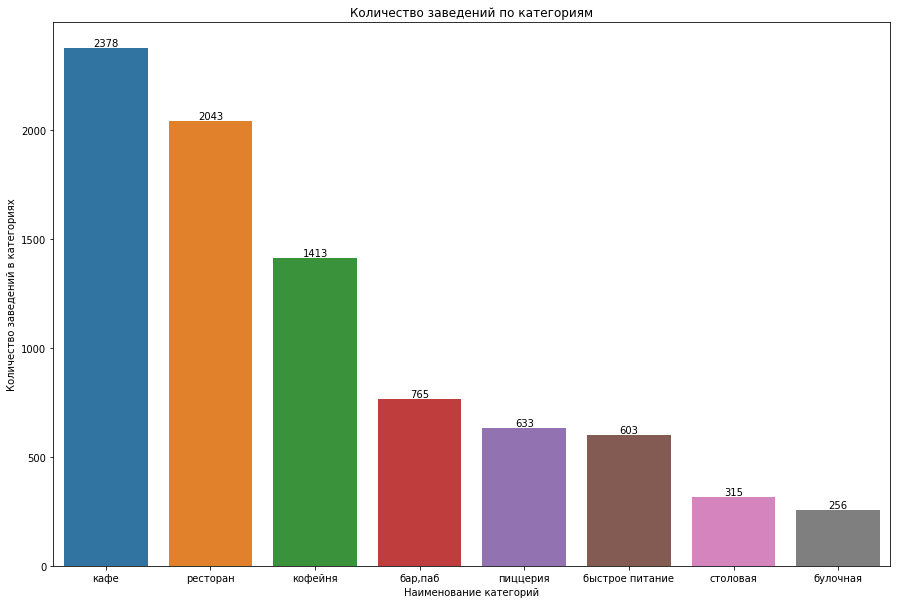

In [11]:
#Сделаем визуализации количества заведений по категориям
sum_names = df['name'].count()
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=data_category, x='category', y='total')
plt.title('Количество заведений по категориям')
plt.xlabel('Наименование категорий')
plt.ylabel('Количество заведений в категориях')
for i, count in enumerate(data_category['total']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()

Наибольшая по численности категория кафе - 2378 заведения, далее идут рестораны и кофейни - 2043 и 1413 соответственно. Наименьшее количество у булочных.

### Исследуем количество посадочных мест по категориям заведений

In [12]:
#Сгруппируем категории заведений по медианному количеству посадочных мест
data_seats = df.groupby('category').agg({'seats': 'median'}).sort_values(by='seats', ascending=False).reset_index()
data_seats['seats'] = data_seats['seats'].round(0)
data_seats['seats'] = data_seats['seats'].astype('int')
data_seats

,category,seats
0,ресторан,86
1,"бар,паб",82
2,кофейня,80
3,столовая,76
4,быстрое питание,65
5,кафе,60
6,пиццерия,55
7,булочная,50


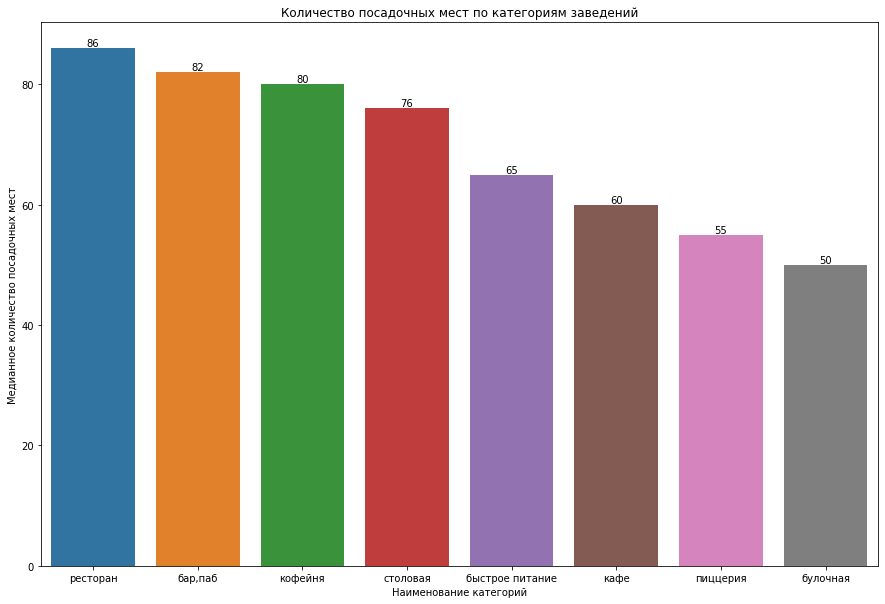

In [13]:
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=data_seats, x='category', y='seats')
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Наименование категорий')
plt.ylabel('Медианное количество посадочных мест')
for i, count in enumerate(data_seats['seats']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()

Наибольшее количество посадочных мест в ресторанах - 86, далее идут бар.паб и кофейня - 82 и 82 соответственно. Наименьшее количество у булочных 50. 

### Рассмотрим соотношение сетевых и несетевых заведений

In [14]:
data_chain = df.groupby('chain').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
data_chain.columns=['chain', 'count']
data_chain['chain'] = data_chain['chain'].replace(0, 'несетевые заведения')
data_chain['chain'] = data_chain['chain'].replace(1, 'сетевые заведения')
data_chain

,chain,count
0,несетевые заведения,5201
1,сетевые заведения,3205


In [15]:
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], # указываем значения, которые появятся на метках
                             values=data_chain['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=800, # указываем размеры графика
                  height=600, 
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Формат заведения',
                                    showarrow=False)])                 

fig.show()

Полученные данные свидетельствуют, что несетевых заведений больше. 

Количество несетевых заведений - 5201 (61.9%) от общего количества заведений. 

Количество сетевых заведений - 3205 (38.1%) от общего количества заведений.

### Установим какие категории заведений чаще являются сетевыми

In [16]:
category_chain = df.query('chain==1').groupby(['category', 'chain']).agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
category_chain['chain'] = category_chain['chain'].replace(1, 'сетевые заведения')
category_ch = df.groupby('category').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
category_chain['%'] = (category_chain['name'] / category_ch['name'] * 100).round(1)
category_chain

,category,chain,name,%
0,кафе,сетевые заведения,779,32.8
1,ресторан,сетевые заведения,730,35.7
2,кофейня,сетевые заведения,720,51.0
3,пиццерия,сетевые заведения,330,43.1
4,быстрое питание,сетевые заведения,232,36.7
5,"бар,паб",сетевые заведения,169,28.0
6,булочная,сетевые заведения,157,49.8
7,столовая,сетевые заведения,88,34.4


In [17]:
#Визуализируем
fig = px.bar(category_chain, x='category', y='%', title='Категории заведений наиболее часто являющиеся сетевыми')
fig.update_layout(xaxis_title='Категория заведения',
                  yaxis_title='Количество заведений в категории',
                  height=800,
                  width=1000)
fig.update_xaxes(categoryorder='total ascending')

fig.show()

Чаще всего являются сетевым заведениями: 
1. Кофейни - 51%;
2. Булочные - 49.8%;
3. Пиццерии - 43.1% 

### Определим топ-15 популярных заведений в Москве

In [18]:
top_15 = df.query('chain==1').groupby(['name', 'category'], as_index = False)\
         .agg({'chain': 'count'}).sort_values(by='chain', ascending=False)\
         .reset_index(drop=True).head(15)
top_15.columns=['name', 'category', 'total']
top_15

,name,category,total
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [19]:
fig = px.histogram(top_15, 
                   x='name', 
                   y='total',
                   color='category',
                   title='Топ-15 популярных заведений',
                   range_x=[-0.5, 14.5],
                   nbins=1600, # назначаем число корзин
                   barmode='overlay') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Наименование заведения') # подпись для оси X
fig.update_yaxes(title_text='Количество') # подпись для оси Y
fig.show()

Самыми популярными заведениями являются: 
1. Безусловный лидер - `Шоколадница`, категория: `кофейня`, количество - `119 заведений`;
2. Второе место - `Домино'с Пицца`, категория: `пиццерия`, количество - `76 заведений`;
3. Третье место - `Додо Пицца`, категория: `пиццерия`, количество - `74 заведения`.

### Выясним какие административные районы Москвы присутствуют, а также отобразим общее количество заведений и категорий заведений по районам.

In [20]:
#Выясним какие административные районы присутствуют в датасете
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ            900 
Южный административный округ               892 
Северо-Восточный административный округ    891 
Западный административный округ            851 
Восточный административный округ           798 
Юго-Восточный административный округ       714 
Юго-Западный административный округ        709 
Северо-Западный административный округ     409 
Name: district, dtype: int64

In [21]:
data_district = df.groupby(['district', 'category'], as_index = False)\
         .agg({'name': 'count'}).sort_values(by='name', ascending=False)\
         .reset_index(drop=True)
data_district.columns=['district', 'category', 'total']
data_district['district'] = data_district['district'].replace('Центральный административный округ', 'ЦАО')
data_district['district'] = data_district['district'].replace('Северный административный округ', 'САО')
data_district['district'] = data_district['district'].replace('Южный административный округ', 'ЮАО')
data_district['district'] = data_district['district'].replace('Северо-Восточный административный округ', 'СВАО')
data_district['district'] = data_district['district'].replace('Западный административный округ', 'ЗАО')
data_district['district'] = data_district['district'].replace('Восточный административный округ', 'ВАО')
data_district['district'] = data_district['district'].replace('Юго-Восточный административный округ', 'ЮВАО')
data_district['district'] = data_district['district'].replace('Юго-Западный административный округ', 'ЮЗАО')
data_district['district'] = data_district['district'].replace('Северо-Западный административный округ', 'СЗАО')
data_district

,district,category,total
0,ЦАО,ресторан,670
1,ЦАО,кафе,464
2,ЦАО,кофейня,428
3,ЦАО,"бар,паб",364
4,ЮВАО,кафе,282
...,...,...,...
67,СЗАО,"бар,паб",23
68,СЗАО,столовая,18
69,ЮЗАО,столовая,17
70,ЮВАО,булочная,13


In [22]:
fig = px.bar(data_district, x='district', y='total', color='category', title='Общее количество заведений и категорий по районам')
fig.update_layout(xaxis_title='Район',
                  yaxis_title='Количество заведений и категории',
                  height=800,
                  width=1000)
fig.show()

Из полученных данных мы видим, что у нас имеется 9 районов, наибольшее количество заведений находится в ЦАО, САО, СВАО и ЮАО.

### Визуализируем распределение средних рейтингов по категориям заведений

In [23]:
data_rating = df.groupby('category', as_index=False).agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()
data_rating['rating'] = data_rating['rating'].round(1)
data_rating

,index,category,rating
0,0,"бар,паб",4.4
1,5,пиццерия,4.3
2,6,ресторан,4.3
3,4,кофейня,4.3
4,1,булочная,4.3
5,7,столовая,4.2
6,3,кафе,4.1
7,2,быстрое питание,4.1


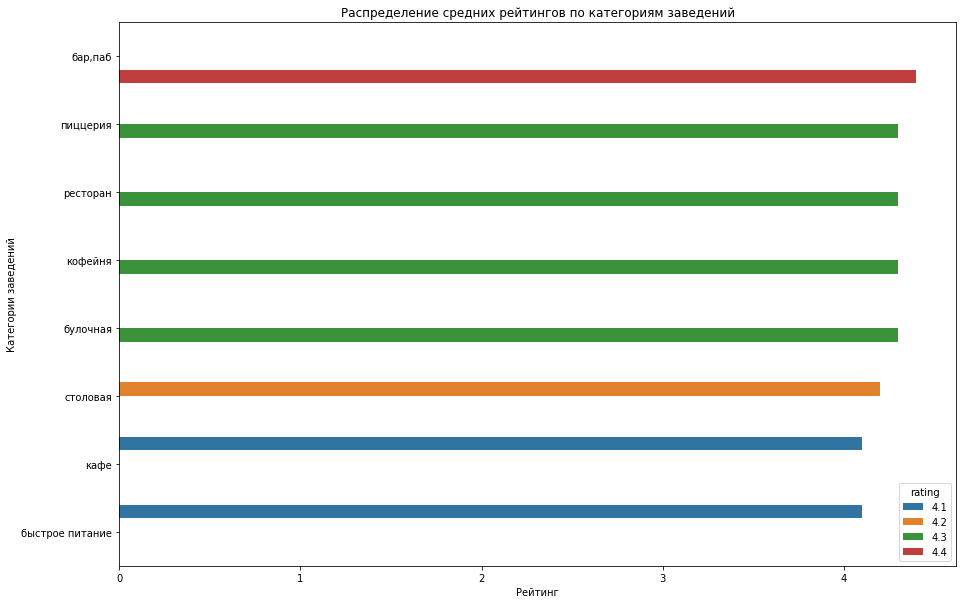

In [24]:
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=data_rating, x='rating', y='category', hue='rating')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Категории заведений')
plt.show()

Распределение среднего рейтинга по категориям показывает: 
1. Наибольший средний рейтинг у баров и пабов - 4.4;
2. Вторую позицию занимают пиццерия, ресторан, булочная и кофейня - 4.3
3. Третье место у столовых - 4.2;
4. Последнее место у кафе и заведений быстрого питания - 4.1

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [25]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df['rating'] = rating_df['rating'].round(1)
rating_df

,district,rating
5,Центральный административный округ,4.4
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
8,Южный административный округ,4.2
1,Западный административный округ,4.2
0,Восточный административный округ,4.2
7,Юго-Западный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [26]:
#Визуализируем

district_geo = '/datasets/admin_level_geomap.geojson' 

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
	geo_data=district_geo,
	data=rating_df,
	columns=['district', 'rating'],
	key_on='feature.name', 
	fill_color='YlGn', 
	fill_opacity=0.8,
	legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Исходя из данных: 
1. Заведения ЦАО имеют наибольший рейтинг - 4.4;
2. Остальные районы имеют приблизительно одинаковый средний рейтинг - 4.2;
3. Самый низкий средний рейтинг у СВАО и ЮВАО - 4.1.


**Отобразим все заведения датасета на карте с помощью кластеров**

In [27]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)


def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
df.apply(create_marker, axis=1)
    
# выводим карту
m

### Найдем топ-15 улиц с заведениями

In [28]:
top_15_street = df.groupby(['street', 'category'], as_index=False).agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index(drop=True).head(15)
top_15_street.columns=['street', 'category', 'total']
top_15_street

,street,category,total
0,проспект Мира,кафе,53
1,проспект Мира,ресторан,45
2,МКАД,кафе,45
3,проспект Мира,кофейня,36
4,Профсоюзная улица,кафе,35
5,проспект Вернадского,ресторан,33
6,Ленинский проспект,ресторан,33
7,Люблинская улица,кафе,26
8,Профсоюзная улица,ресторан,26
9,Ленинский проспект,кафе,26


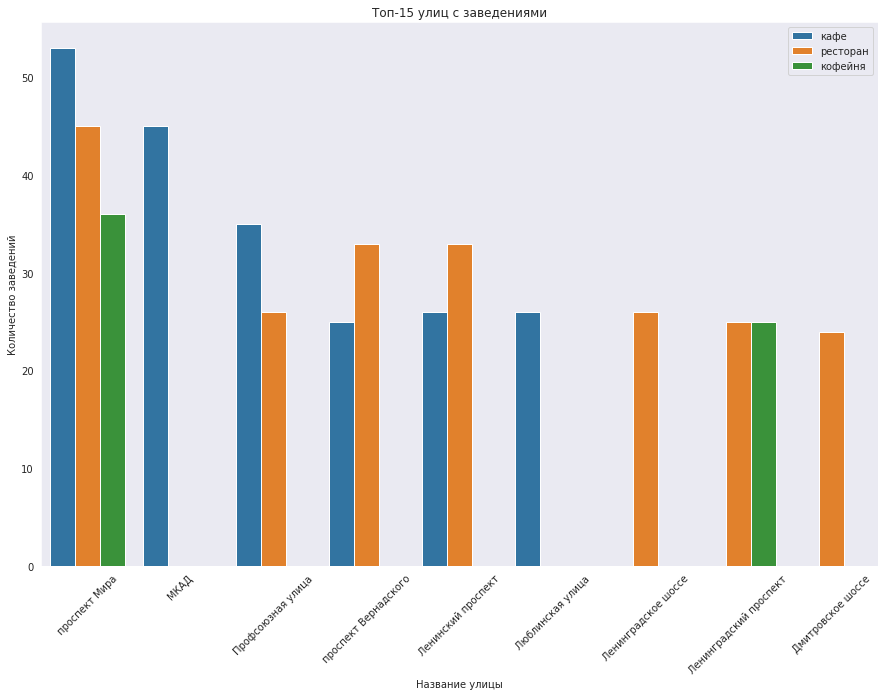

In [29]:
plt.figure(figsize=(15, 10))
sns.set_style('dark')
sns.barplot(x='street', y='total', data=top_15_street, hue='category')
plt.title('Топ-15 улиц с заведениями')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.legend(loc='upper right')

plt.show()

На проспекте Мира находится самое большое количество заведений, из которых 53 кафе, 45 рестораны и 36 кофейни. 

На МКАДе находится большое количество кофейнь - 45. 

На Профсоюзной улице, проспекте Вернадского и Ленинградском проспекте находится приблизительно одинакое количество заведений. 

### Найдем улицы, на которых находится только один объект общепита

In [30]:
#street_pivot = df.pivot_table(index='street', values='name', aggfunc='count').query('name == 1')
#street_pivot
lonely = df.groupby('street').agg(count=('name', 'count')).sort_values(by='count', ascending=False).reset_index().query('count == 1')['street']
lonely.count()

458

В датасете таких улиц - 458 

In [31]:
df_lonely = df.query('street in @lonely')
df_lonely.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


**Посмотрим как делятся данные заведения по категориям**

In [32]:
category_df_lonely = df_lonely.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
category_df_lonely.columns=['category', 'total']
category_df_lonely

,category,total
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


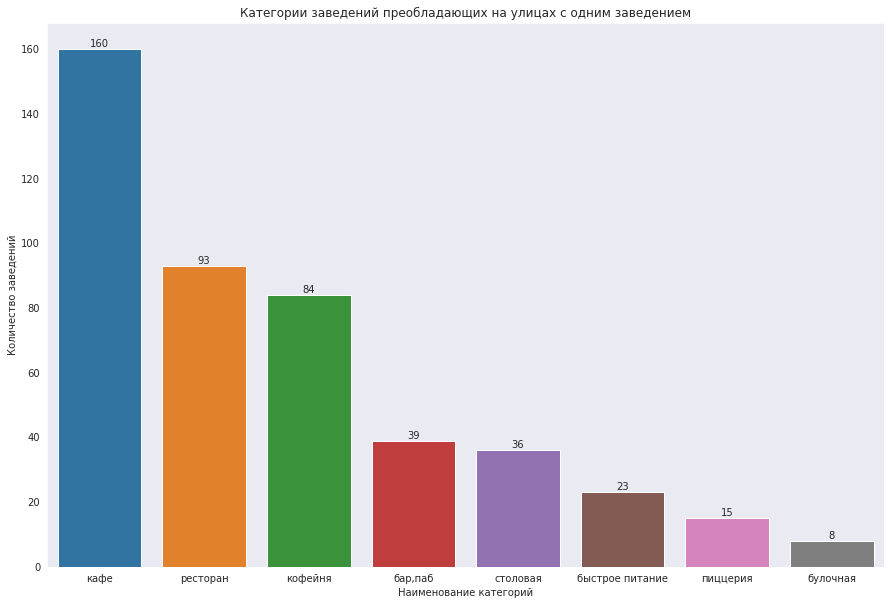

In [33]:
#Визуализируем


plt.figure(figsize=(15, 10))
ax = sns.barplot(data=category_df_lonely, x='category', y='total')
plt.title('Категории заведений преобладающих на улицах с одним заведением')
plt.xlabel('Наименование категорий')
plt.ylabel('Количество заведений')
for i, count in enumerate(category_df_lonely['total']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()


Посмотрим улиц имеют только одно заведение в ЦАО

In [34]:
category_df_lonely = df_lonely.query('district == "Центральный административный округ"').groupby('category')['name'].count().sort_values(ascending=False).reset_index()
category_df_lonely.columns=['category', 'total']
category_df_lonely

,category,total
0,кафе,38
1,ресторан,36
2,кофейня,34
3,"бар,паб",23
4,столовая,7
5,быстрое питание,3
6,булочная,2
7,пиццерия,2


Можно сказать, что на улицах с одним заведением преобладает категория заведений - Кафе. Далее идут рестораны и кофейня.

### Посчитаем медиану среднего чека для каждого района

In [35]:
avg_bill_district = df.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
avg_bill_district.columns=['district', 'avg_bill']
avg_bill_district

,district,avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [36]:
#Визуализируем 
district_geo = '/datasets/admin_level_geomap.geojson' 

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
	geo_data=district_geo,
	data=avg_bill_district,
	columns=['district', 'avg_bill'],
	key_on='feature.name', 
	fill_color='YlGn', 
	fill_opacity=0.8,
	legend_name='Медиана среднего чека по районам',
).add_to(m)

m


Хороплет показывает, что наибольшая медианная средняя цена в ЗАО и ЦАО - 1000 рублей, что связано с наличием большого количества заведений, а также с тем, что в данных районах преобладающее количество жителей состоятельные. В других направлениях, чем дальше от центра города тем медианная средняя цена ниже. Самый низкий показатель в ЮВАО - 450 рублей.

### Вывод

Исходя из полученных результатов в настоящем этапе можно подвести следующие итоги: 
1. Выделены 3 `наибольшие категории заведений` общепита: 
- `кафе` - 2378 заведений;
- `рестораны` - 2043 заведения; 
- `кофейни` - 1413 заведения; 
2. `Наибольшое количество посадчных мест` у следующих категорий: 
- `рестораны` - 86;
- `бар.паб` - 82;
- `кофейня` - 82.
3. `Количество несетевых заведений преобладает` над сетевыми 5201 и 3205 соответственно.
4. `Наибольшее количество сетевых заведений` имеют следующие категории:
- Кофейни - 51% сетевых заведений;
- Булочные - 49.8% сетевых заведений;
- Пиццерии - 43.1% сетевых заведений.
5. Самые популярные заведения в Москве по количеству заведений в сети:
- Безусловный лидер - Шоколадница, категория: кофейня, количество - 119 заведений;
- Второе место - Домино'с Пицца, категория: пиццерия, количество - 76 заведений;
- Третье место - Додо Пицца, категория: пиццерия, количество - 74 заведения.
6. Наибольшее количество заведений расположено в ЦАО - 2242;
7. Наибольший средний рейтинг из всех заведений у баров и пабов - 4.4. 
8. Заведения ЦАО имеют наибольший рейтинг - 4.4.
9. Из всех улиц на проспекте Мира находится самое большое количество заведений, из которых 53 кафе, 45 рестораны и 36 кофейни.
10. При рассмотрении улиц на которых расположено только одно заведение с вероятностью 35% можно утверждать, что будет находится кафе, 20% - ресторан, 18% - кофейня. 
11. Наибольшая медиана среднего чека в ЗАО и ЦАО - 1000 рублей, наименьшая в ЮВАО - 450. 

## `Этап 3 ` - детализация исследования на примере открытия кофейни

Поскольку заказчикам не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Установим сколько всего кофеен в датасете

In [37]:
df['category'].value_counts().reset_index()

,index,category
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


В датасете имеется 1413 кофейн. 

Для дальнейшей работы создадим датасет только с одной категорией заведений - кофейнями.

In [38]:
df_cafe = df.loc[df['category']== 'кофейня']

df_cafe['district'] = df_cafe['district'].replace('Центральный административный округ', 'ЦАО')
df_cafe['district'] = df_cafe['district'].replace('Северный административный округ', 'САО')
df_cafe['district'] = df_cafe['district'].replace('Южный административный округ', 'ЮАО')
df_cafe['district'] = df_cafe['district'].replace('Северо-Восточный административный округ', 'СВАО')
df_cafe['district'] = df_cafe['district'].replace('Западный административный округ', 'ЗАО')
df_cafe['district'] = df_cafe['district'].replace('Восточный административный округ', 'ВАО')
df_cafe['district'] = df_cafe['district'].replace('Юго-Восточный административный округ', 'ЮВАО')
df_cafe['district'] = df_cafe['district'].replace('Юго-Западный административный округ', 'ЮЗАО')
df_cafe['district'] = df_cafe['district'].replace('Северо-Западный административный округ', 'СЗАО')

df_cafe.head()

/tmp/ipykernel_82/3682890702.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_82/3682890702.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_82/3682890702.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_82/3682890

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",САО,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",САО,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",САО,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",САО,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",САО,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


### Рассмотрим в каких районах наибольшее количество кофейней и посмотрим особенности расположения

In [39]:
dist_cafe = df_cafe.groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False)
dist_cafe.columns=['district', 'total']
dist_cafe

,district,total
5,ЦАО,428
2,САО,193
3,СВАО,159
1,ЗАО,150
6,ЮАО,131
0,ВАО,105
8,ЮЗАО,96
7,ЮВАО,89
4,СЗАО,62


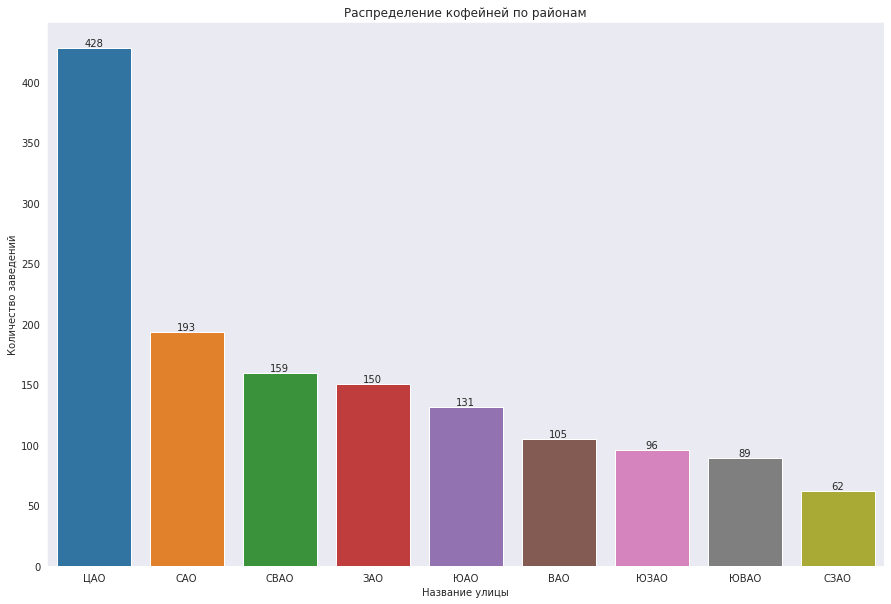

In [40]:
#Визуализируем 
plt.figure(figsize=(15, 10))
sns.set_style('dark')
sns.barplot(x='district', y='total', data=dist_cafe)
plt.title('Распределение кофейней по районам')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')
for i, count in enumerate(dist_cafe['total']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()

Большинство кофейн находится в ЦАО - 428 (30.3%), далее идут САО - 193 (13.7%), СВАО - 159 (11.3%), ЗАО -150 (10.6%) 

**Посмотрим особенности расположения**

In [41]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
   Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['rating']}").add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cafe.apply(create_clusters, axis=1)

# выводим карту
m

Можно отметить, то кофейни находятся по большей части в центре города и их количество снижается в зависимости от удаленности от центра города.

### Выясним, существуют ли круглосуточные кофейни

Посмотрим наиболее популярный график работы кофейн

In [42]:
df_head = df_cafe['hours'].value_counts().head(10)

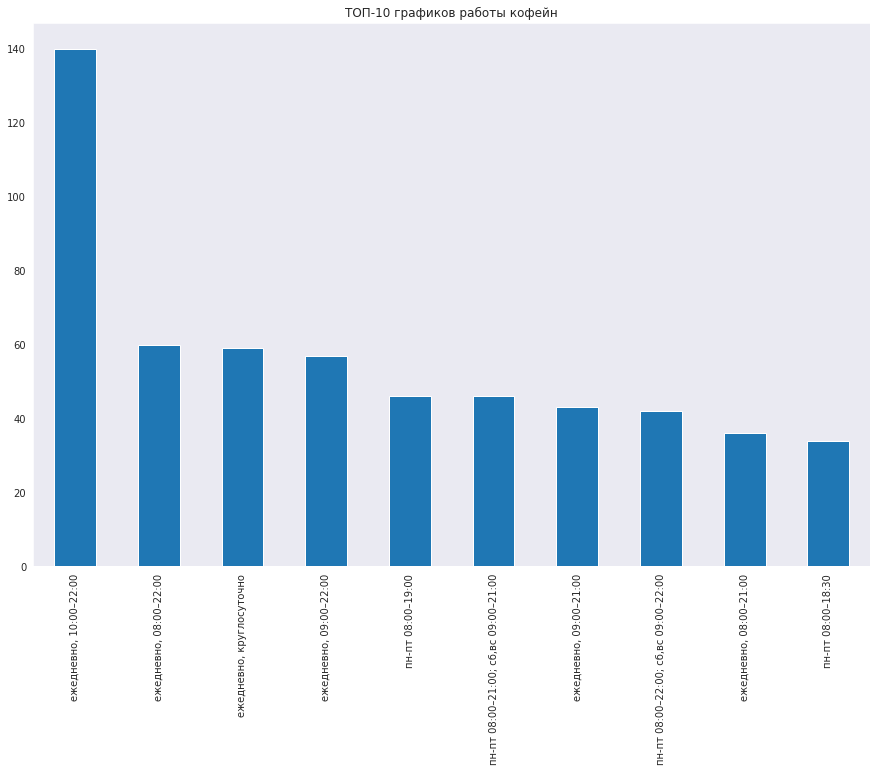

In [43]:
df_head.plot(kind='bar', figsize=(15,10), title='ТОП-10 графиков работы кофейн')
plt.show()




Наиболее популярный график - ежедневно с 10 до 22.

Посмотрим сколько заведений является круглосуточными

In [44]:
df_cafe['is_24_7'].value_counts()

False    1339
True     59  
Name: is_24_7, dtype: int64

Имеется 59 кофейн, которые работают круглосуточно. 

Поссмотрим в каких районах они находятся

In [45]:
df_time = df_cafe.query('is_24_7 == True').groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False)
df_time.columns=['district', 'total']
df_time

,district,total
5,ЦАО,26
1,ЗАО,9
8,ЮЗАО,7
0,ВАО,5
2,САО,5
3,СВАО,3
4,СЗАО,2
6,ЮАО,1
7,ЮВАО,1


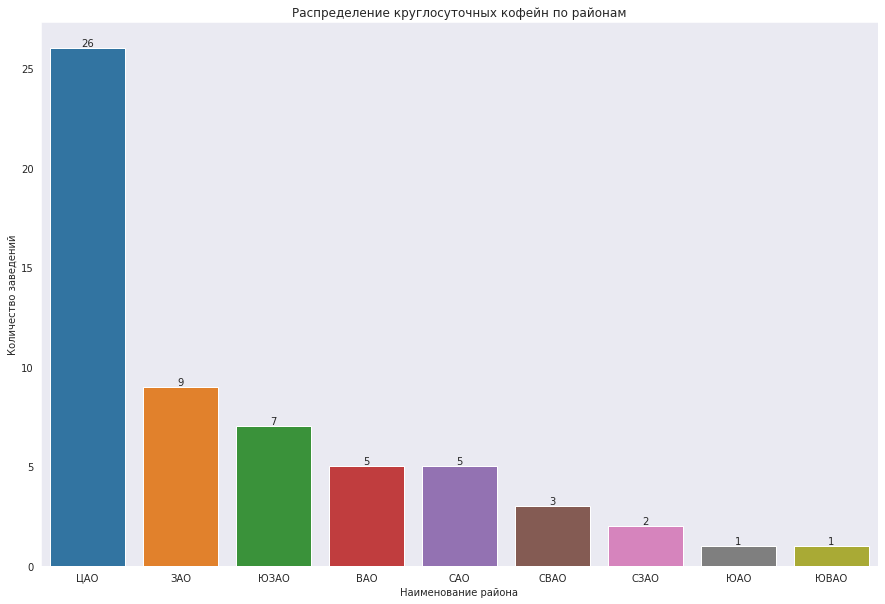

In [46]:
#Визуализируем
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='district', y='total', data=df_time)
plt.title('Распределение круглосуточных кофейн по районам')
plt.xlabel('Наименование района')
plt.ylabel('Количество заведений')
for i, count in enumerate(df_time['total']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()


26 круглосуточных кофейн в ЦАО, 9 в ЗАО и только 1 в ЮВАО

### Рассмотрим рейтинги кофейн и как они распределяются по районам

In [47]:
cafe_rating = df_cafe.groupby('district').agg({'rating': 'median'}).sort_values(by='rating', ascending=False).reset_index()
cafe_rating

,district,rating
0,ВАО,4.3
1,САО,4.3
2,СВАО,4.3
3,СЗАО,4.3
4,ЦАО,4.3
5,ЮАО,4.3
6,ЮВАО,4.3
7,ЮЗАО,4.3
8,ЗАО,4.2


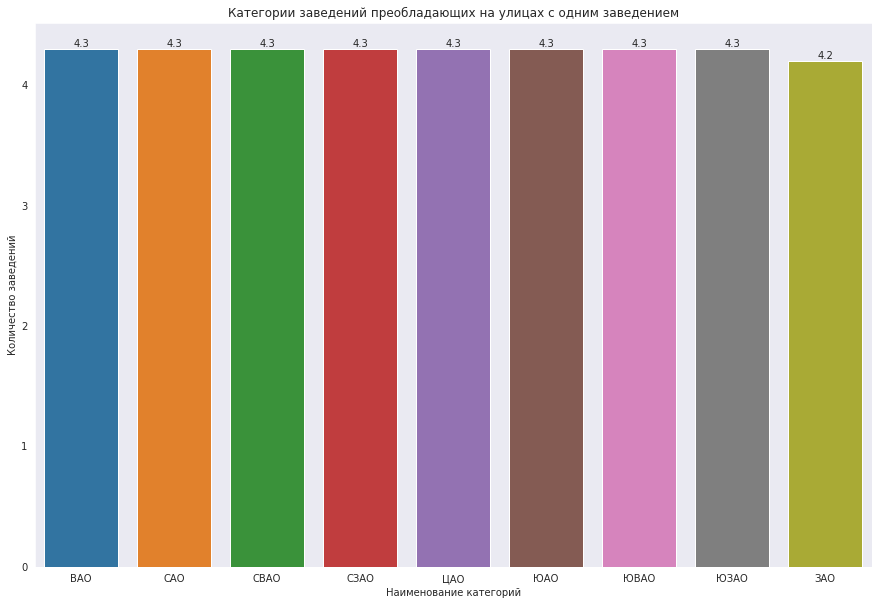

In [48]:
# Визуализируем


plt.figure(figsize=(15, 10))
ax = sns.barplot(data=cafe_rating, x='district', y='rating')
plt.title('Категории заведений преобладающих на улицах с одним заведением')
plt.xlabel('Наименование категорий')
plt.ylabel('Количество заведений')
for i, count in enumerate(cafe_rating['rating']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.show()

Медианый рейтинг у всех кофейн одинаковый, за исключением ЗАО, где он ниже на 0.2%.

### Посчитаем на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

In [49]:
cup_cost = df_cafe.query('middle_coffee_cup != 0').groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).reset_index()
cup_cost.columns=['district', 'middle_coffee_cup_cost']
cup_cost

,district,middle_coffee_cup_cost
0,ЮЗАО,198.0
1,ЦАО,190.0
2,ЗАО,189.0
3,СЗАО,165.0
4,СВАО,162.5
5,САО,159.0
6,ЮАО,150.0
7,ЮВАО,147.5
8,ВАО,135.0


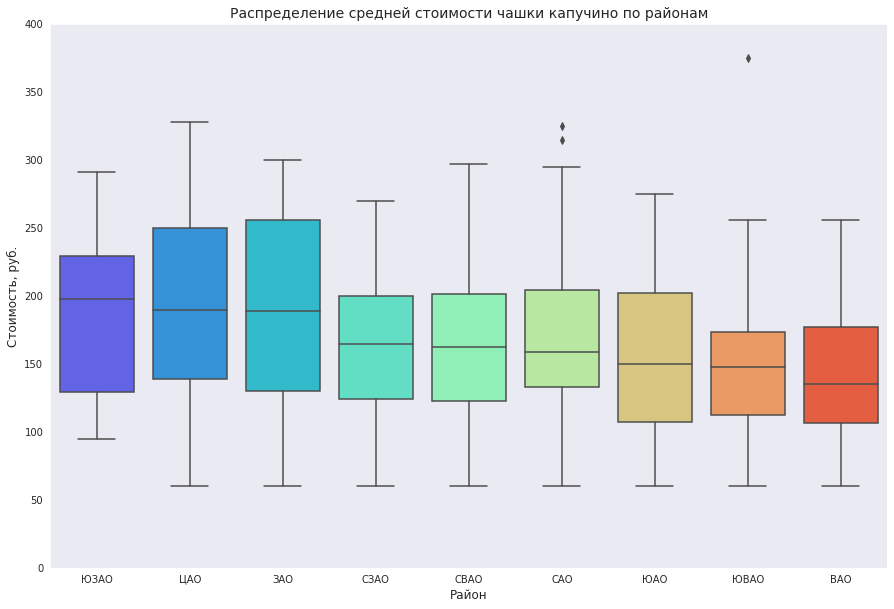

In [50]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='district', 
            y='middle_coffee_cup', 
            data=df_cafe, 
            order=cup_cost.district, 
            palette='rainbow')
plt.title('Распределение средней стоимости чашки капучино по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Стоимость, руб.', fontsize=12)
plt.ylim(0, 400)
plt.show()

Таким образом, наибольшая стоимость чашки капучино будет в ЮЗАО практически 200 рублей.

На втором месте ЦАО и ЗАО около 190 рублей за чашку капучино. 

Наименьшая цена в ВАО - 135 рублей за чашку капучино. 


**Посмотрим на среднюю стоимость чашки кофе по Москве**

In [51]:
df_cafe['middle_coffee_cup'].describe().reset_index()

,index,middle_coffee_cup
0,count,521.000000
1,mean,175.055662
2,std,89.753009
3,min,60.000000
4,25%,124.000000
5,50%,170.000000
6,75%,225.000000
7,max,1568.000000


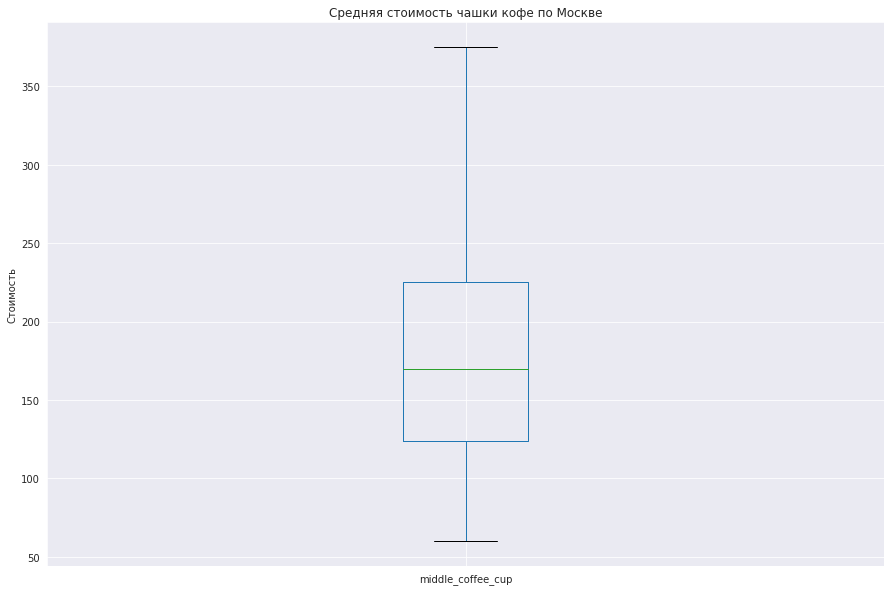

In [52]:
df_cafe = df_cafe[(df_cafe['middle_coffee_cup'] <= 400)&(df_cafe['middle_coffee_cup'] >= 50)] #уберем выбросы

plt.figure(figsize=(15, 10))
df_cafe.boxplot(column='middle_coffee_cup')
plt.title('Средняя стоимость чашки кофе по Москве')
plt.ylabel('Стоимость')
plt.show()

Средняя стоимость чашки кофе по Москве составляет 170 рублей.

### Вывод

В данном исследовании было выяснено: 
1. В Москве имеется 1413 кофейн.
2. Большинство кофейн находится: 
- ЦАО - 428 кофейни;
- CАО - 193 кофейни
- СВАО - 159 кофейн;
- ЗАО - 150 кофейн.

Меньше всего в СЗАО - 62 кофейни.

3. Имеется 59 круглосуточных кофеен почти половина в ЦАО (26) и только 1 в ЮВАО.
4. Был рассмотрен медианный рейтинг кофеен по районам, практически у всех районов кофейни имеют рейтинг 4.3, исключение составляет ЗАО с рейтингом 4.2.
5. Наибольшая стоимость чашки капучино будет в ЮЗАО, ЦАО и ЗАО 190-200 рублей, наименьшая стоимость в ВАО - 135 рублей. 


Рекомендации для Заказчика: 
- определить бюджет, который выделяется на открытие заведения;
- рассмотреть открытие уникальной кофейни со своими фишками и плюшками;
- установить график работы заведения ежедневно с 10 до 22;
- стоимость ассортимента должна устанавливаться в зависимости от района нахождения заведения.



Расположение презентации: https://drive.google.com/file/d/1jMFxIm4OZaT-AA2yN55byoct63bVfpE7/view?usp=share_link